# **HNS Projekt č. 1 - Dataset Architektúra**


In [1]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import torch
from dataset_architecture import *
from metrics import *
from models_architecture import *
from torch.utils.data import DataLoader
from torchvision import transforms, models
from torchvision.transforms import v2

MODELS_DIR = "projekt-architektura/VAST"
DATA_PTH = "projekt-architektura/architectural-styles-dataset/"
RESIZE = (512, 512)
CROP = (448, 448)

if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")

plt.rcParams['axes.labelsize'] = 14   # Label font size
plt.rcParams['axes.titlesize'] = 16  # Title font size
plt.rcParams['xtick.labelsize'] = 12  # X-axis tick label font size
plt.rcParams['ytick.labelsize'] = 12  # Y-axis tick label font size


c:\Users\marti\miniconda3\envs\win-torch\lib\site-packages\torchvision\datapoints\__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
c:\Users\marti\miniconda3\envs\win-torch\lib\site-packages\torchvision\transforms\v2\__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedba

## **Dataset**

### Dataset Architektúra obsahuje ~ 10K obrazových vzoriek, rozdelených do 25 kategórií, podľa architektonického štýlu 

### Transformacie

In [2]:
transform = transforms.Compose(
    [
        transforms.Resize(RESIZE, transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop(CROP),
        transforms.ToTensor(),
        transforms.ConvertImageDtype(dtype=torch.float32),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ]
)

_, test_ds = get_random_split_arch_dataset(
    DATA_PTH, transform=transform, split=0.8, seed=420
)
testloader = DataLoader(test_ds, batch_size=32, shuffle=False)

Train size : 8072, Test size : 2017


### Ukazka vzoriek

In [ ]:
transform_showcase = transforms.Compose(
    [
        transforms.Resize((768, 768), transforms.InterpolationMode.BILINEAR),
        transforms.ToTensor(),
        transforms.ConvertImageDtype(dtype=torch.float32),
    ]
)

_, test_dataset = get_random_split_arch_dataset(
    DATA_PTH, transform=transform_showcase, split=0.8, seed=420
)
dataloader = DataLoader(test_dataset, batch_size=1, shuffle=True)

# Get the class names from the dataset (assuming the dataset has a `classes` attribute)
class_names = test_dataset.dataset.classes

# Initialize a display window (you may need to install OpenCV)
cv2.namedWindow("Image", cv2.WINDOW_NORMAL)
x, y = 50, 50

# Define the font type, scale, color, and thickness
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (0, 255, 0)  # Green color in BGR
font_thickness = 2

# Loop through each class and display one sample from each class
for class_idx, class_name in enumerate(class_names):
    # Find a sample from the current class
    found_sample = False
    for image, label in dataloader:
        if label == class_idx:
            found_sample = True
            image = image.squeeze(0).numpy()  # Convert tensor to NumPy array
            image = image.transpose(1, 2, 0)  # Transpose the dimensions
            image = (image * 255).astype("uint8")  # Convert back to 8-bit image
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
            cv2.namedWindow(f"{class_name}", cv2.WINDOW_NORMAL)
            cv2.putText(
                image,
                f"{class_name}",
                (x, y),
                font,
                font_scale,
                font_color,
                font_thickness,
            )
            cv2.moveWindow(f"{class_name}", 500, 100)
            cv2.imshow(f"{class_name}", image)
            cv2.waitKey(0)
            cv2.destroyAllWindows()
            break

    if not found_sample:
        print(f"No sample found for class: {class_name}")

### **Vstupné dáta**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Train size : 8072, Test size : 2017


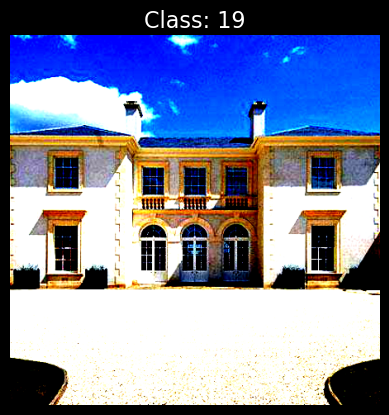

In [3]:
_, test_dataset = get_random_split_arch_dataset(
    DATA_PTH, transform=transform, split=0.8, seed=420
)
dataloader = DataLoader(test_dataset, batch_size=1, shuffle=True)
for image, label in dataloader:
    image = image.squeeze(0).numpy()  # Convert tensor to NumPy array
    plt.imshow(image.transpose(1, 2, 0))  # Transpose the dimensions for Matplotlib
    plt.title(f"Class: {label.item()}")  # Display the class label as the title
    plt.axis("off")  # Turn off axis labels
    plt.show()
    break

### **Histogram datasetu a váhovanie jednotlivých tried**

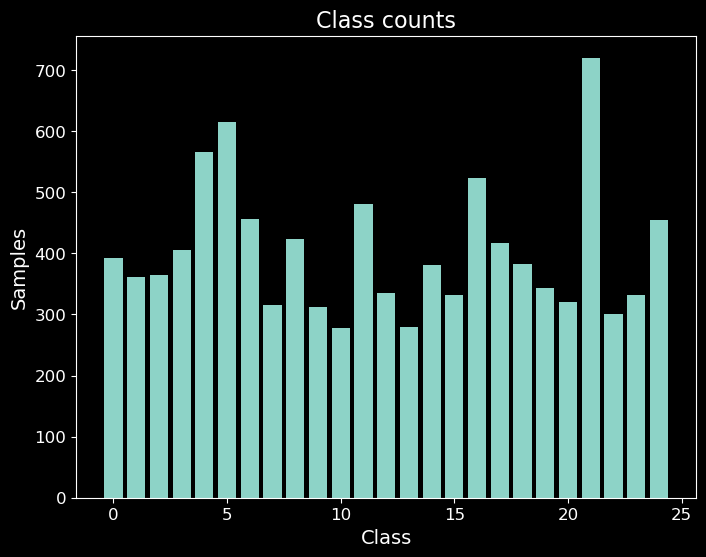

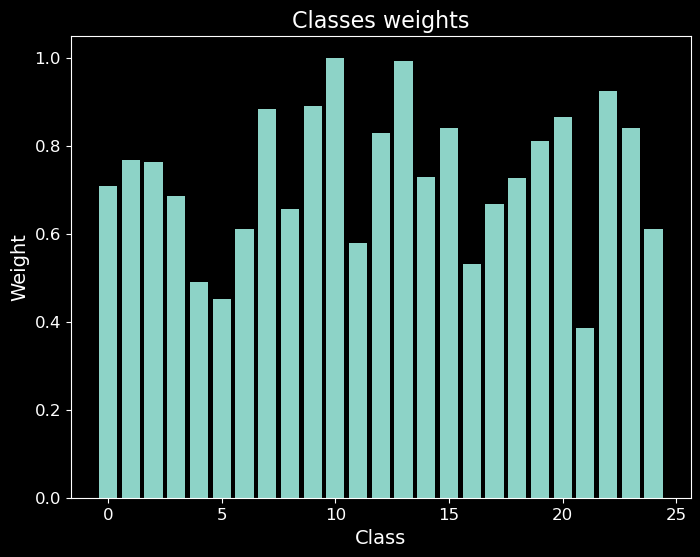

In [5]:
class_counts = count_class_samples(dataset=None, cached=True)
plt.figure(figsize=(8, 6))
plt.bar(list(class_counts.keys()), list(class_counts.values()))
plt.xlabel("Class")
plt.ylabel("Samples")
plt.title("Class counts")
plt.show()

classes_weights = get_classes_weights()
plt.figure(figsize=(8, 6))
plt.bar([i for i in range(0, 25)], classes_weights)
plt.xlabel("Class")
plt.ylabel("Weight")
plt.title("Classes weights")
plt.show()

## **Predtrénované štruktúry**
- #### Resnet18 
- #### MobileNetV3Large
- #### InceptionV3
- #### AlexNet

In [6]:
sheets = pd.read_excel("projekt-architektura/doc/experimenty.xlsx", sheet_name=None)
for i, (sheet_name, df) in enumerate(sheets.items()):
    print(
        f"{sheet_name}",
    )
    display(df.head())
    if i == 3:
        break

MOBILENET


,TRIAL,EPOCHS,UNFREEZE,LR,BATCH,RESIZE,CROP,VAL LOSS,VAL ACC
0,1,40,20,0.00001,64,512,448,0.97,0.71
1,2,70,30,0.00001,64,512,448,0.99,0.71
2,3,70,0,0.00001,64,512,448,0.94,0.71


INCEPTION


,TRIAL,EPOCHS,UNFREEZE,LR,BATCH,RESIZE,CROP,VAL LOSS,VAL ACC
0,1,40,10,0.00001,64,512,448,0.95,0.73
1,2,40,10,0.00001,64,299,299,1.05,0.70
2,2,40,10,0.00100,64,299,299,1.40,0.56


RESNET18


,TRIAL,EPOCHS,UNFREEZE,LR,BATCH,RESIZE,CROP,VAL LOSS,VAL ACC
0,1,40,10,0.00001,64,512,448,0.84,0.76
1,2,40,10,0.00001,128,512,448,0.87,0.74
2,3,40,10,0.00001,128,256,224,1.03,0.69


ALEXNET


,TRIAL,EPOCHS,UNFREEZE,LR,BATCH,RESIZE,CROP,VAL LOSS,VAL ACC
0,3,40,10,0.00001,64,512,448,NaN,NaN
1,2,40,10,0.00001,128,512,448,1.08,0.68
2,1,40,10,0.00001,256,512,448,NaN,NaN


### **ResNet18**

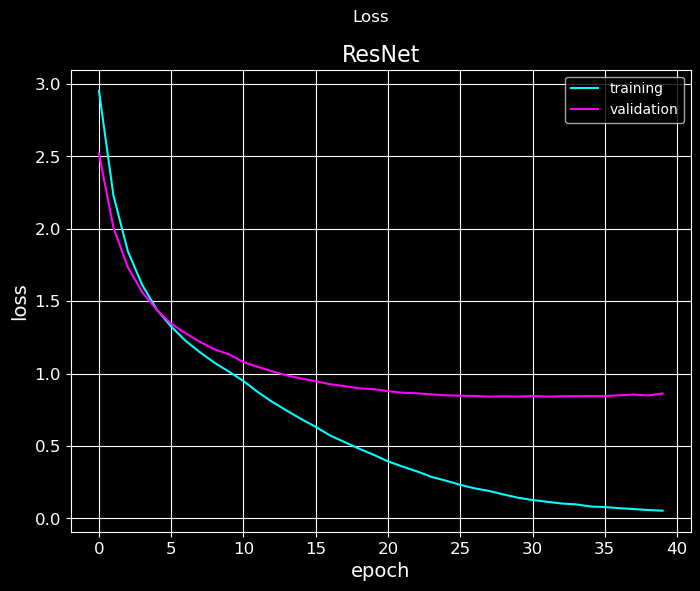

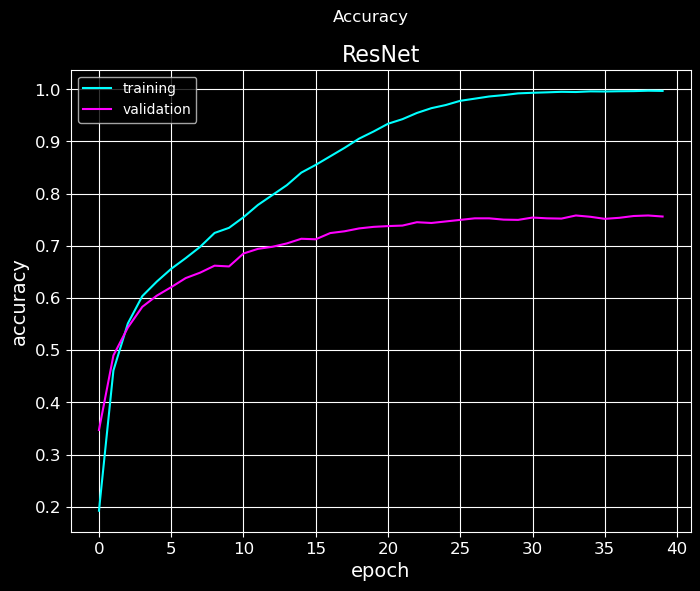

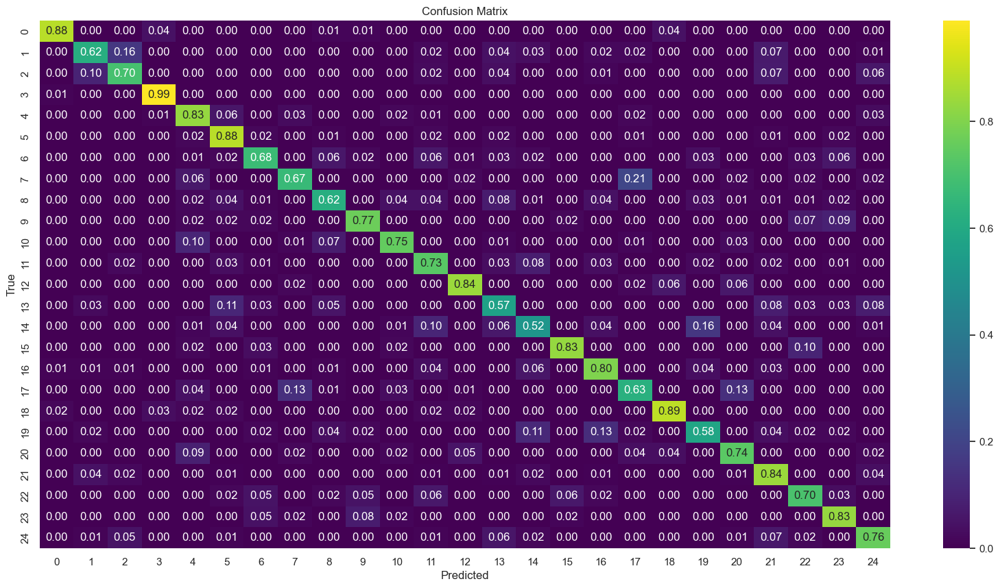

'RESNET'

,TRIAL,EPOCHS,UNFREEZE,LR,BATCH,RESIZE,CROP,VAL LOSS,VAL ACC
0,1,40,10,0.00001,64,512,448,0.84,0.76
1,2,40,10,0.00001,128,512,448,0.87,0.74
2,3,40,10,0.00001,128,256,224,1.03,0.69


In [7]:
df = pd.read_excel("projekt-architektura/doc/experimenty.xlsx", sheet_name='RESNET18')
model = resnet18_architecture()
model.load_state_dict(torch.load(f"{MODELS_DIR}/ResNet/1/model.pt"))
plot_train_perf(f"{MODELS_DIR}/ResNet/1/train_metrics.pkl", "ResNet")
stats = test_model(model, testloader)
generate_confusion_matrix(*stats)
display('RESNET')
df.head()

### **MobileNet**

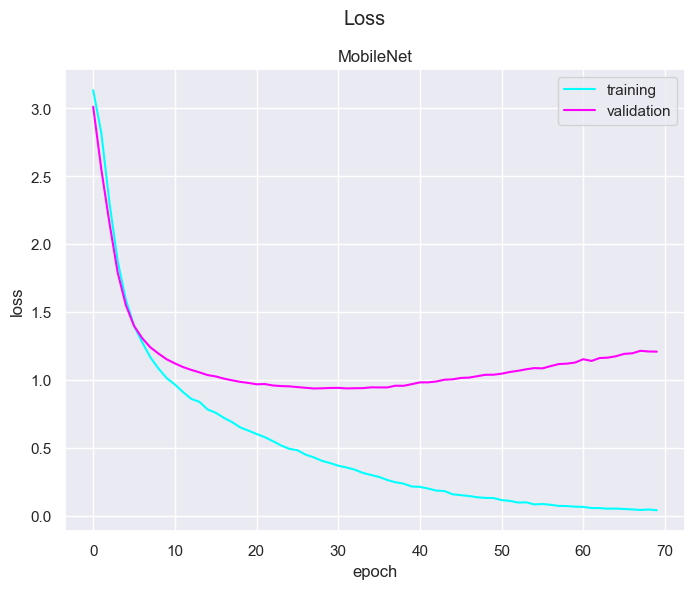

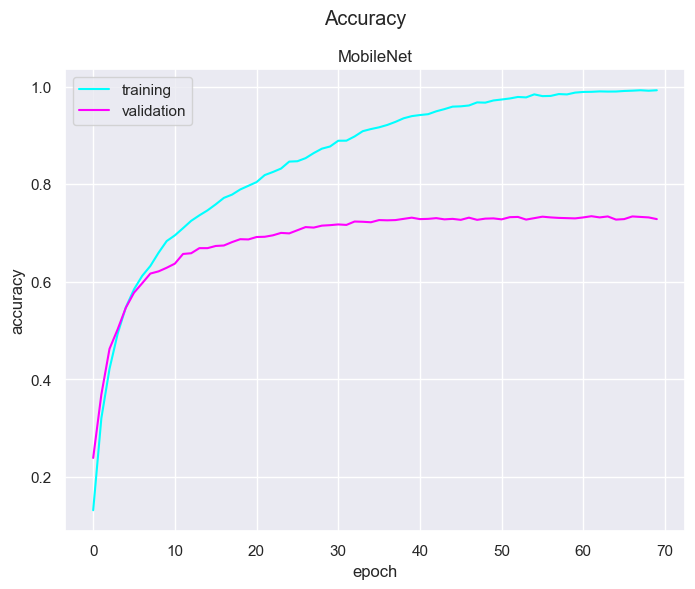

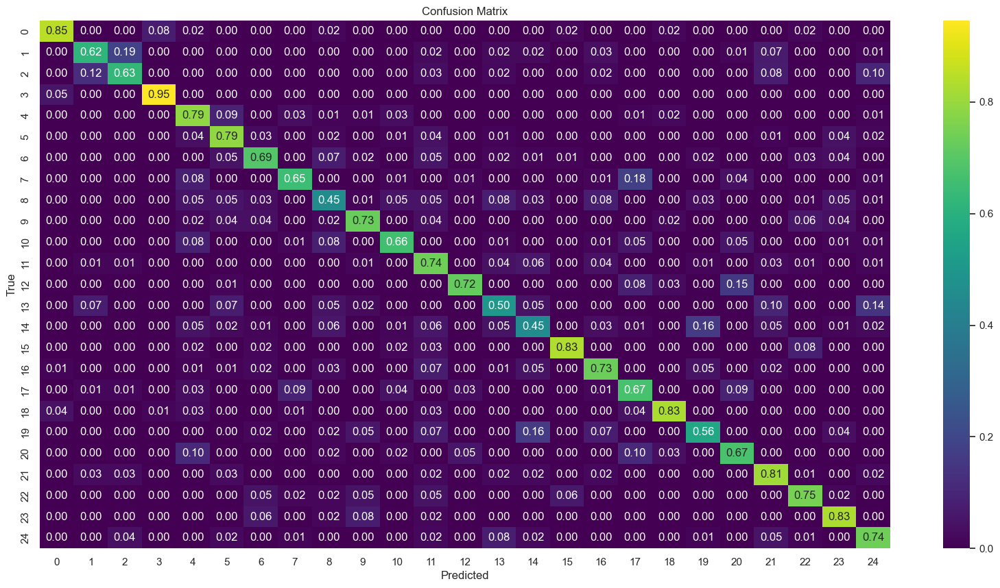

'MOBILENET'

,TRIAL,EPOCHS,UNFREEZE,LR,BATCH,RESIZE,CROP,VAL LOSS,VAL ACC
0,1,40,20,0.00001,64,512,448,0.97,0.71
1,2,70,30,0.00001,64,512,448,0.99,0.71
2,3,70,0,0.00001,64,512,448,0.94,0.71


In [8]:
model = mobilenet_architecture()
model.load_state_dict(torch.load(f"{MODELS_DIR}/MobileNetV3/3/model.pt"))
plot_train_perf(f"{MODELS_DIR}/MobileNetV3/3/train_metrics.pkl", "MobileNet")
stats = test_model(model, testloader)
generate_confusion_matrix(*stats)
df = pd.read_excel("projekt-architektura/doc/experimenty.xlsx", sheet_name='MOBILENET')
display('MOBILENET')
df.head()

### **Inception**

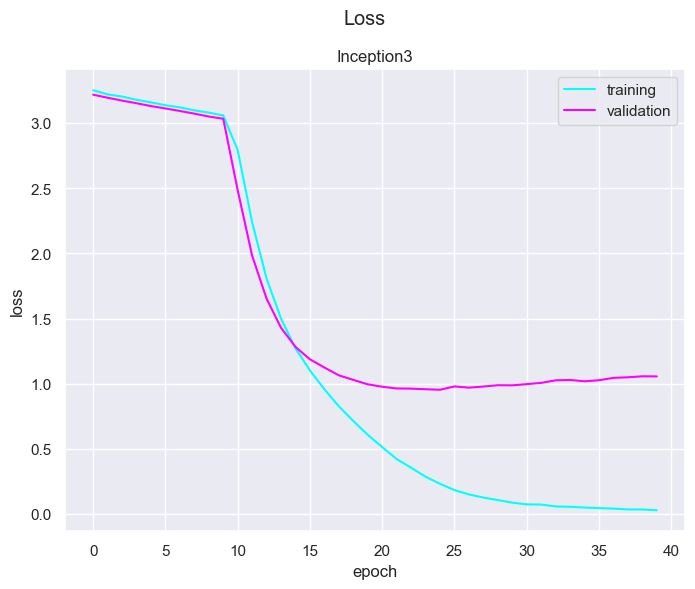

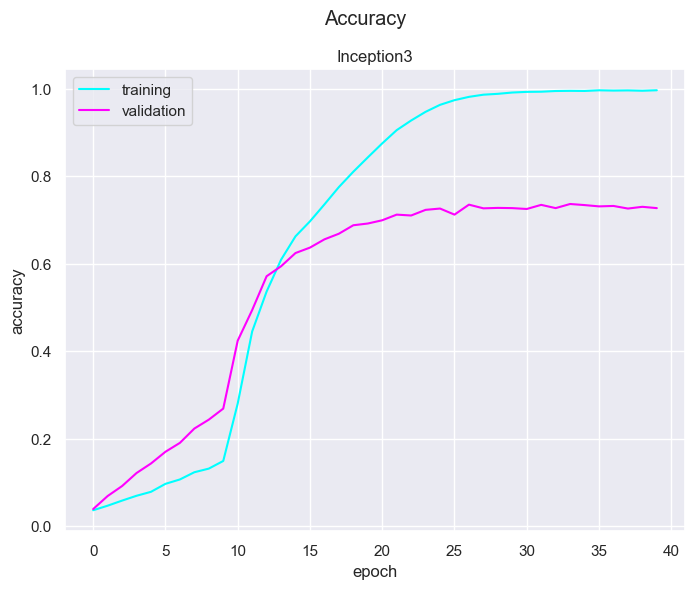

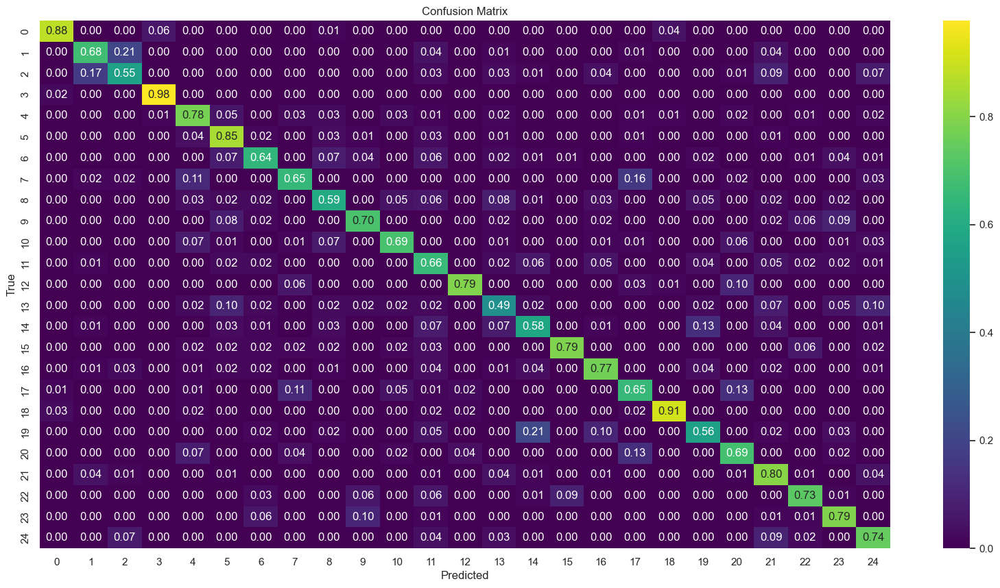

'INCEPTION'

,TRIAL,EPOCHS,UNFREEZE,LR,BATCH,RESIZE,CROP,VAL LOSS,VAL ACC
0,1,40,10,0.00001,64,512,448,0.95,0.73
1,2,40,10,0.00001,64,299,299,1.05,0.70
2,2,40,10,0.00100,64,299,299,1.40,0.56


In [9]:
model = inception_architecture()
model.load_state_dict(torch.load(f"{MODELS_DIR}/Inception3/1/model.pt"))
plot_train_perf(f"{MODELS_DIR}/Inception3/1/train_metrics.pkl", "Inception3")
stats = test_model(model, testloader)
generate_confusion_matrix(*stats)
df = pd.read_excel("projekt-architektura/doc/experimenty.xlsx", sheet_name='INCEPTION')
display('INCEPTION')
df.head()

### **AlexNet**

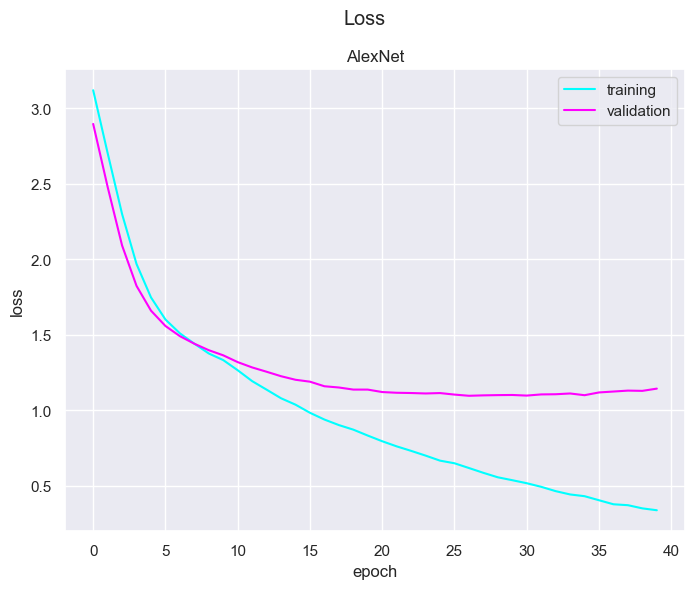

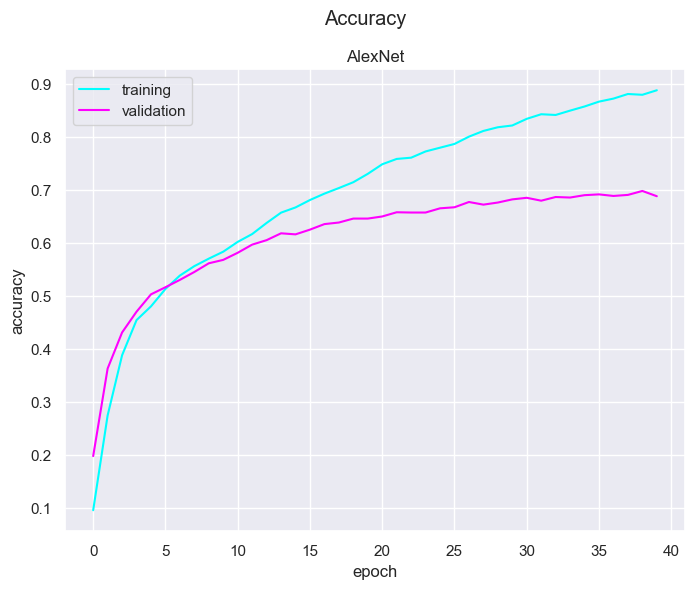

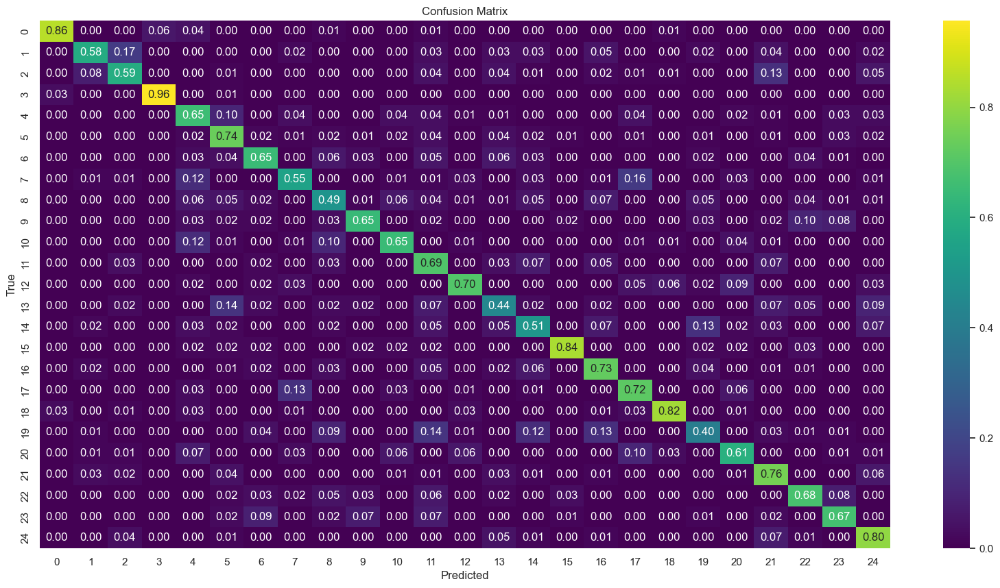

'ALEXNET'

,TRIAL,EPOCHS,UNFREEZE,LR,BATCH,RESIZE,CROP,VAL LOSS,VAL ACC
0,3,40,10,0.00001,64,512,448,NaN,NaN
1,2,40,10,0.00001,128,512,448,1.08,0.68
2,1,40,10,0.00001,256,512,448,NaN,NaN


In [11]:
model = alexnet_architecture()
model.load_state_dict(torch.load(f"{MODELS_DIR}/AlexNet/1/model.pt"))
plot_train_perf(f"{MODELS_DIR}/AlexNet/1/train_metrics.pkl", "AlexNet")
stats = test_model(model, testloader)
generate_confusion_matrix(*stats)
df = pd.read_excel("projekt-architektura/doc/experimenty.xlsx", sheet_name='ALEXNET')
display('ALEXNET')
df.head()

## **Vlastné štruktúry**


### Seriova struktura

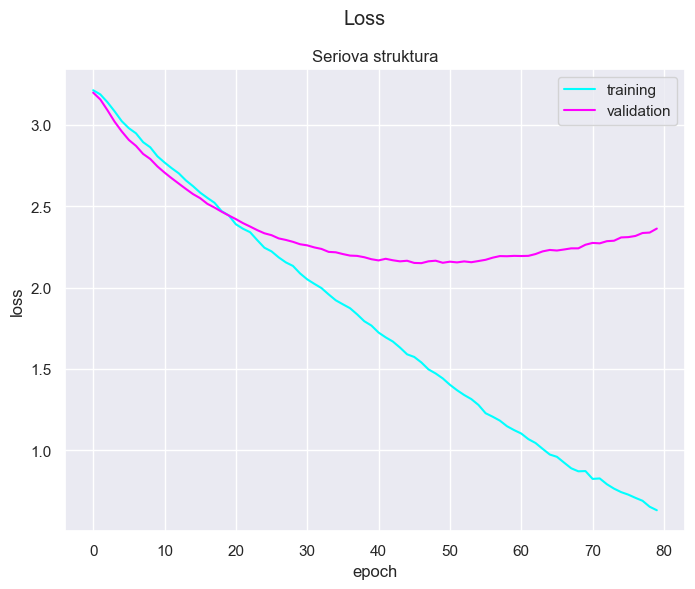

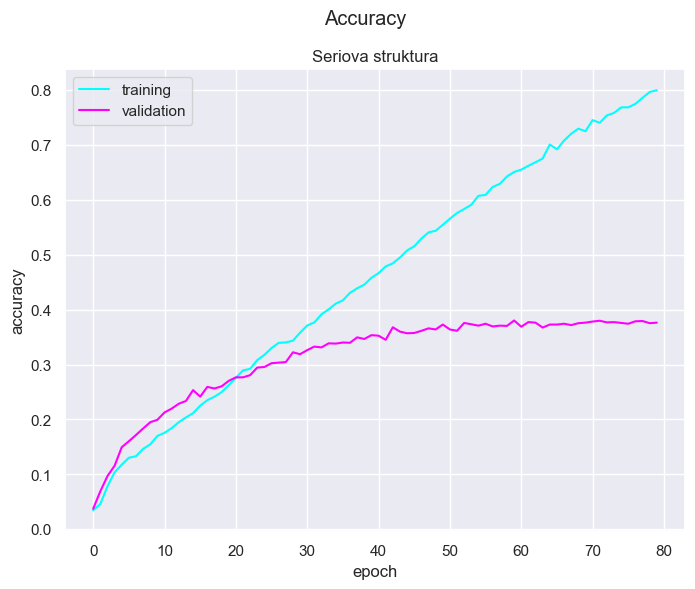

Train size : 8072, Test size : 2017


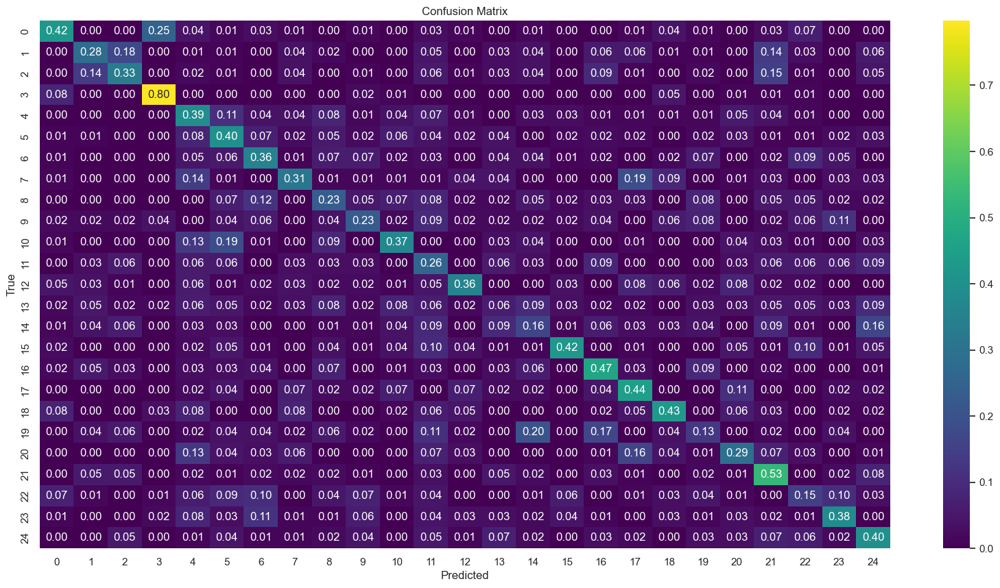

DeepSerialCNN(
  (conv1): Sequential(
    (0): Conv2d(3, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(12, 24, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): AvgPool2d(kernel_size=2, stride=1, padding=0)
  )
  (conv3): Sequential(
    (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): AvgPool2d(kernel_size=2, stride=1, padding=0)
    (4): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (fc_layers): Sequential(
    (0): Dropout(p=0.4, inplace=False)
    (1): Linear(in_fe

In [13]:
model = DeepSerialCNN()
model.load_state_dict(torch.load(f"{MODELS_DIR}/DeepSerialCNN/2/model.pt"))
plot_train_perf(f"{MODELS_DIR}/DeepSerialCNN/train_metrics.pkl", 'Seriova struktura')
transform = transforms.Compose(
    [
        transforms.Resize((256,256), transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop((224,224)),
        transforms.ToTensor(),
        transforms.ConvertImageDtype(dtype=torch.float32),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ]
)

_, test_ds = get_random_split_arch_dataset(
    DATA_PTH, transform=transform, split=0.8, seed=420
)
testloader = DataLoader(test_ds, batch_size=32, shuffle=False)
stats = test_model(model, testloader)
generate_confusion_matrix(*stats)
print(model)

## Seriovo paralelna struktura

In [ ]:
model = HybridNet()
model.load_state_dict(torch.load(f"{MODELS_DIR}/HybridNet/1/model.pt"))
plot_train_perf(f"{MODELS_DIR}/HybridNet/1/train_metrics.pkl", 'Seriovo-paralelna struktura')

## **ResNet konvolucne filtre a mapa priznakov**

### Prva konvolucna vrstva

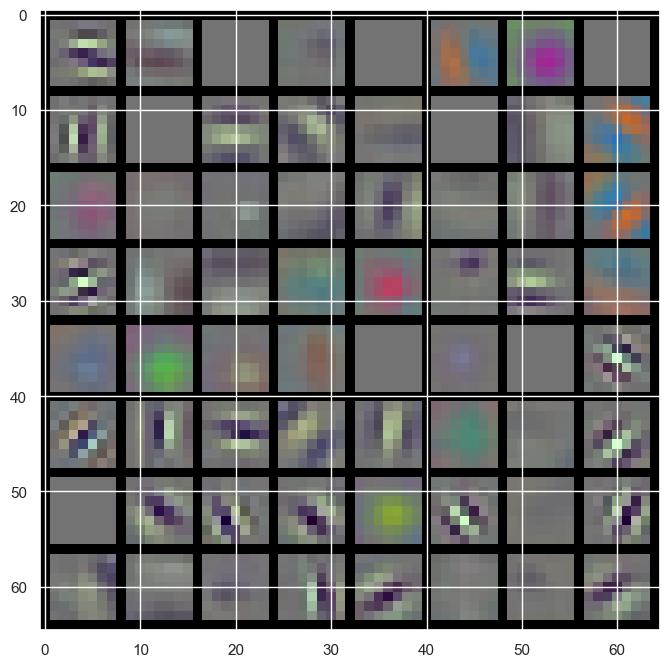

In [15]:
model = resnet18_architecture()
model.load_state_dict(torch.load(f"{MODELS_DIR}/ResNet/1/model.pt"))
filters =  model.conv1.weight.data.clone().cpu()
visTensor(filters)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Train size : 8072, Test size : 2017


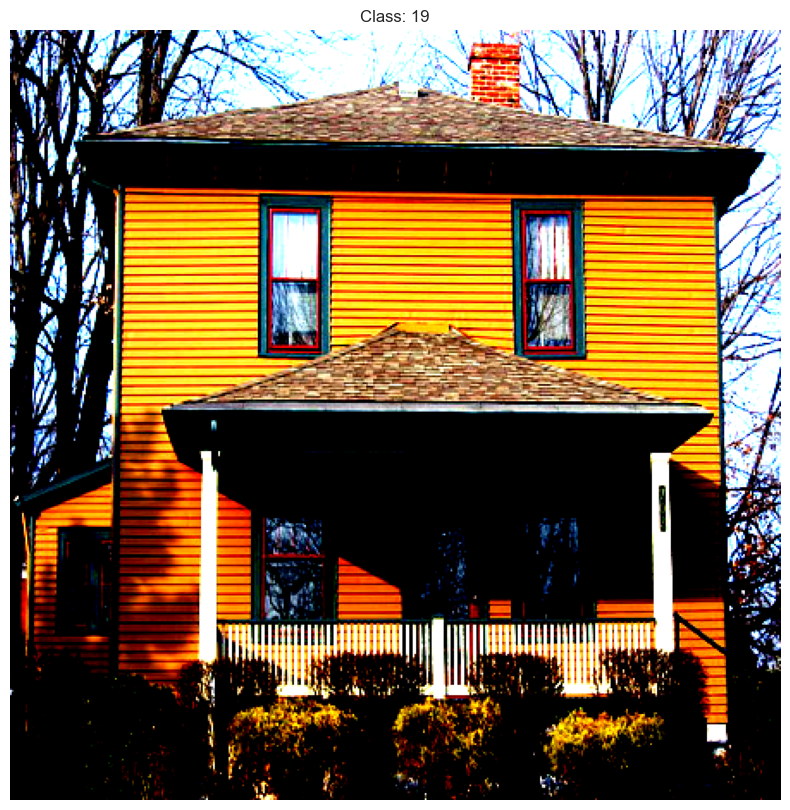

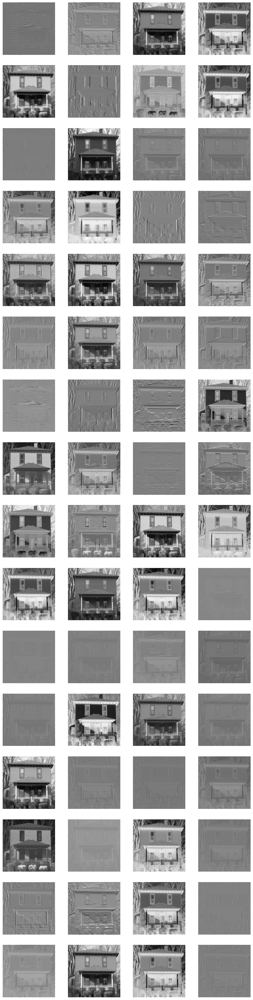

In [21]:
transform = transforms.Compose(
    [
        transforms.Resize(RESIZE, transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop(CROP),
        transforms.ToTensor(),
        transforms.ConvertImageDtype(dtype=torch.float32),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ]
)

_, test_ds = get_random_split_arch_dataset(
    DATA_PTH, transform=transform, split=0.8, seed=420
)
testloader = DataLoader(test_ds, batch_size=32, shuffle=False)

img = next(iter(dataloader))[0]
output = model.conv1(img).squeeze(0).cpu().detach().numpy()
img_numpy = img.squeeze(0).cpu().detach().numpy()
plt.imshow(img_numpy.transpose(1, 2, 0))  
plt.title(f"Class: {label.item()}")  
plt.axis("off") 
plt.show()

fig, axs = plt.subplots(16, 4, figsize=(12, 48))
axs = axs.flatten()

for i in range(output.shape[0]):
    axs[i].imshow(output[i,:,:], cmap='gray')
    axs[i].axis('off')

## Druha konvolucna vrstva

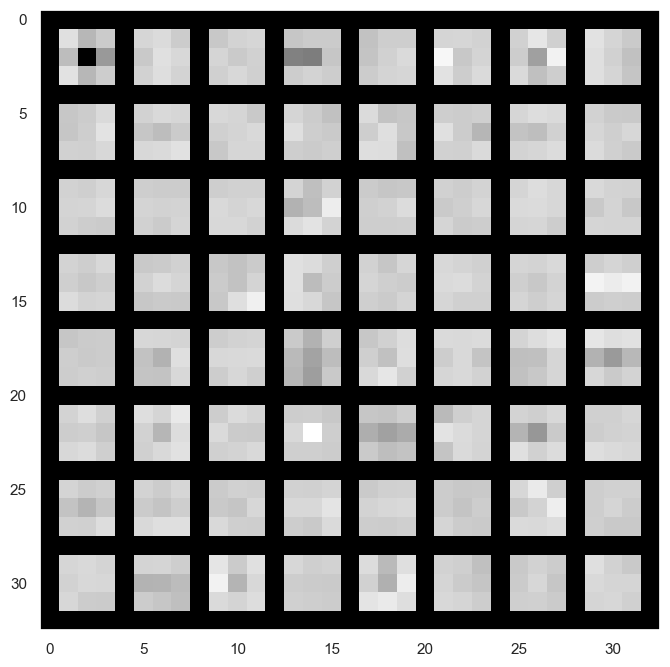

In [23]:
filters = model.layer1[0].conv1.weight.data.cpu()
visTensor(filters)
plt.grid(False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


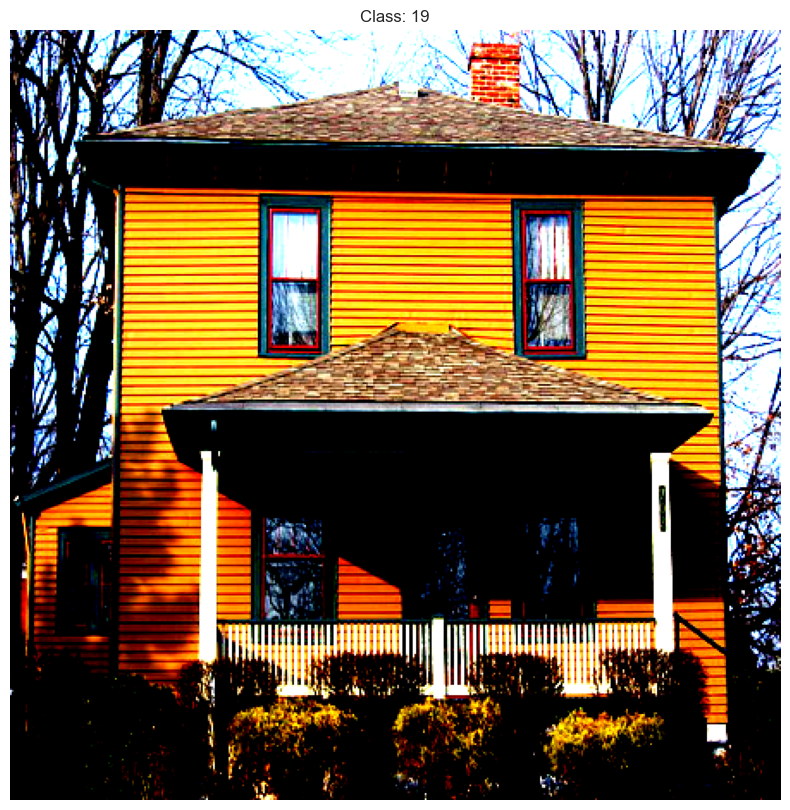

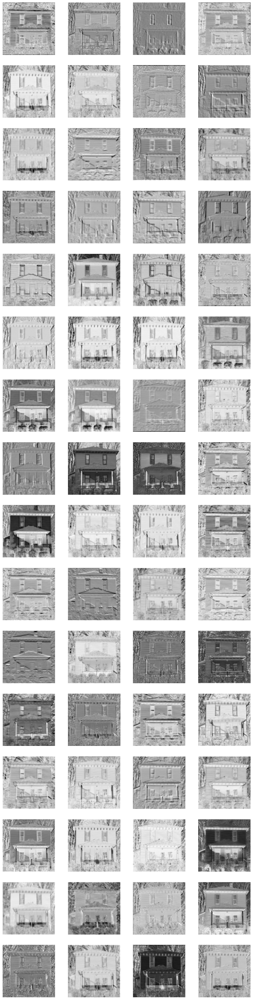

In [25]:
x = model.conv1(img)
x = model.bn1(x)
x = model.relu(x)
x = model.maxpool(x)
output = model.layer1[0].conv1(x).squeeze(0).detach().numpy()

img_numpy = img.squeeze(0).cpu().detach().numpy()
plt.imshow(img_numpy.transpose(1, 2, 0))  
plt.title(f"Class: {label.item()}")  
plt.axis("off") 
plt.show()

fig, axs = plt.subplots(16, 4, figsize=(12, 48))
axs = axs.flatten()

for i in range(output.shape[0]):
    axs[i].imshow(output[i,:,:], cmap='gray')
    axs[i].axis('off')

## ResNet augmentacie

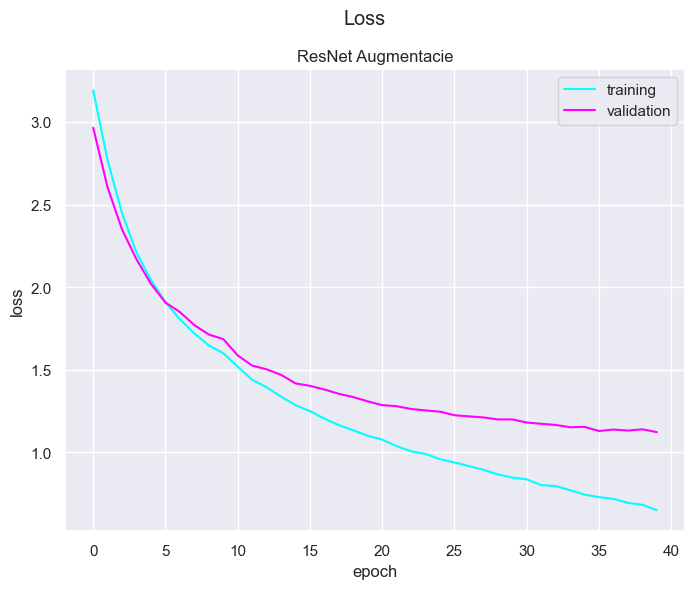

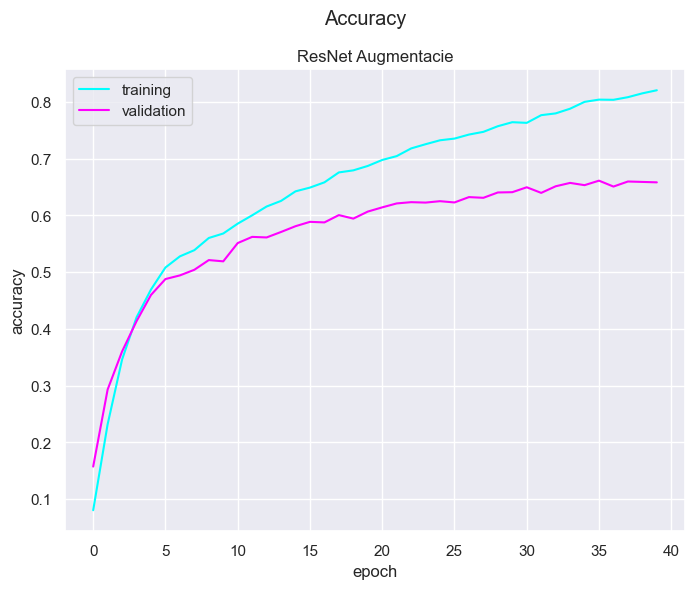

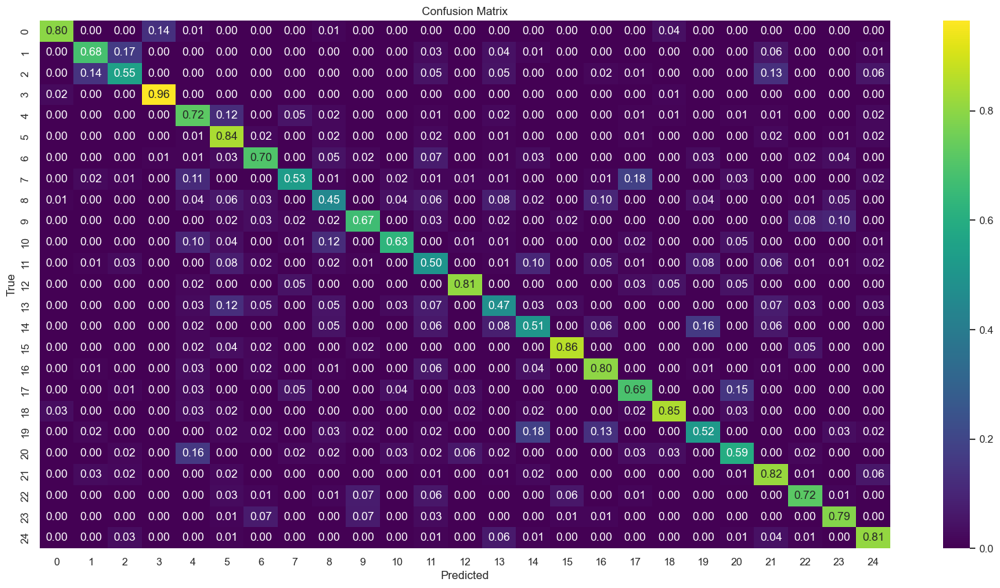

In [26]:
augmentations = transforms.Compose(
    [
        v2.RandomPosterize(bits=2),
        v2.RandomAdjustSharpness(sharpness_factor=2),
        v2.RandomAutocontrast(),
        v2.RandomEqualize(),
        transforms.RandomRotation(10),
        transforms.RandomHorizontalFlip()
    ]
)

model = resnet18_architecture()
model.load_state_dict(torch.load(f"{MODELS_DIR}/ResNet/resnet_augment/model.pt"))
plot_train_perf(f"{MODELS_DIR}/ResNet/resnet_augment/train_metrics.pkl", "ResNet Augmentacie")
stats = test_model(model, testloader)
generate_confusion_matrix(*stats)